<a href="https://colab.research.google.com/github/GJ-007-sage/Generative-Models-/blob/main/CIFAR10_RGB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


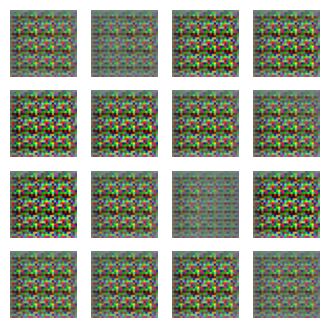

Time for epoch 1 is 23.245258569717407 sec


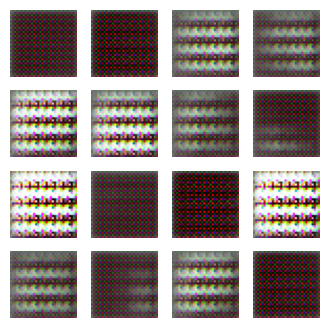

Time for epoch 2 is 12.30968165397644 sec


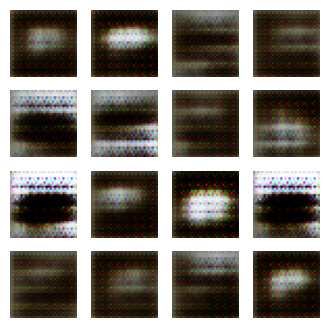

Time for epoch 3 is 12.613292694091797 sec


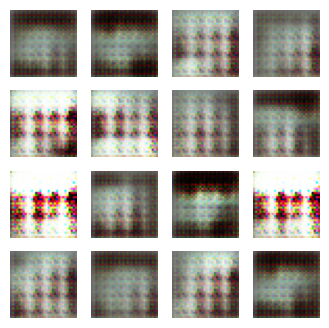

Time for epoch 4 is 12.639647722244263 sec


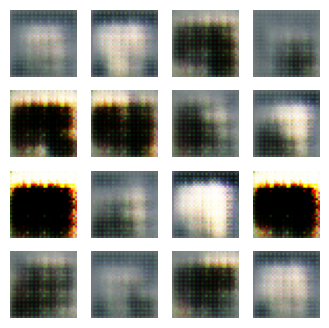

Time for epoch 5 is 13.330156564712524 sec


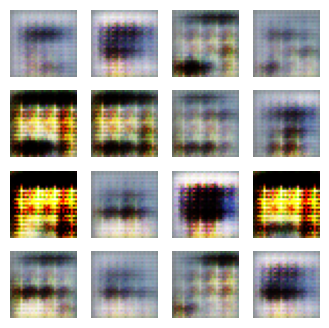

Time for epoch 6 is 13.245792150497437 sec


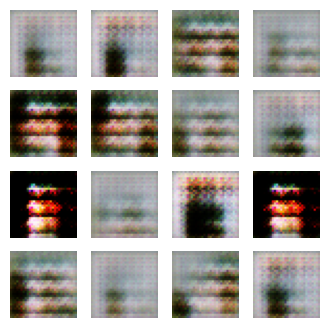

Time for epoch 7 is 12.68240737915039 sec


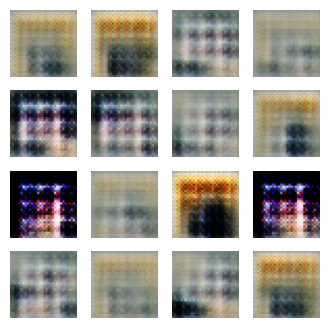

Time for epoch 8 is 12.567137956619263 sec


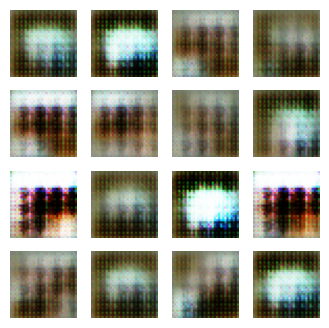

Time for epoch 9 is 12.56039309501648 sec


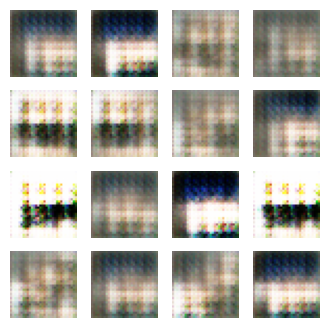

Time for epoch 10 is 12.938804388046265 sec


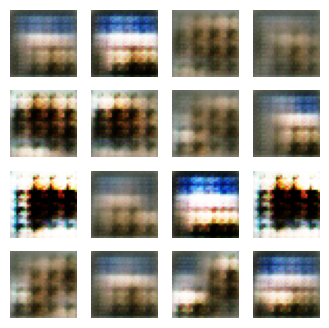

Time for epoch 11 is 12.58721661567688 sec


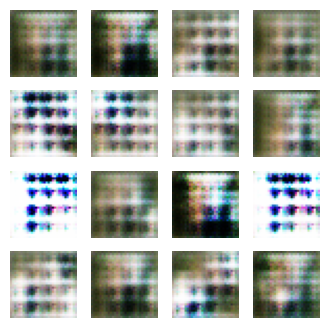

Time for epoch 12 is 12.56175684928894 sec


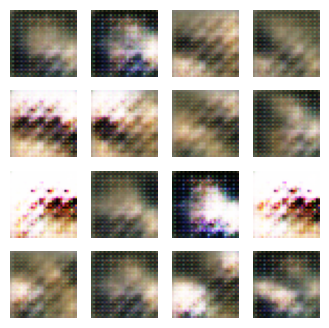

Time for epoch 13 is 12.504814386367798 sec


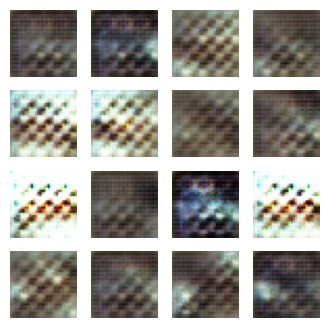

Time for epoch 14 is 12.775275707244873 sec


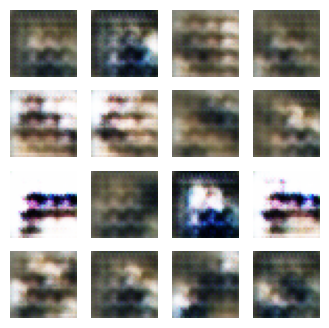

Time for epoch 15 is 12.57809829711914 sec


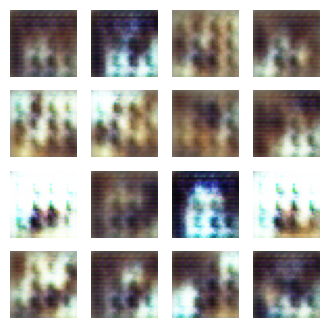

Time for epoch 16 is 12.380004405975342 sec


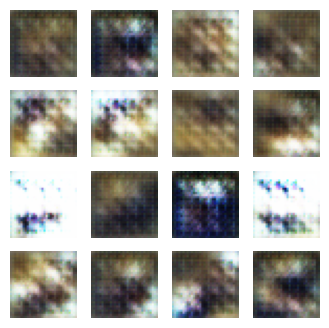

Time for epoch 17 is 12.459609746932983 sec


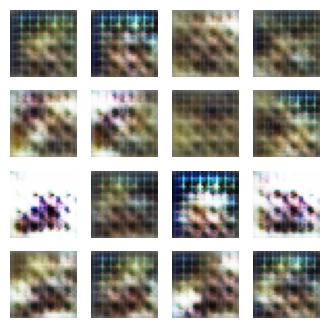

Time for epoch 18 is 12.777893781661987 sec


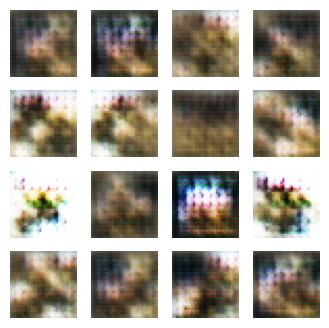

Time for epoch 19 is 12.483401775360107 sec


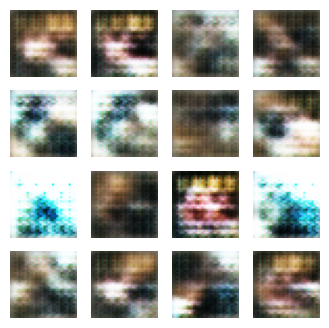

Time for epoch 20 is 12.481866121292114 sec


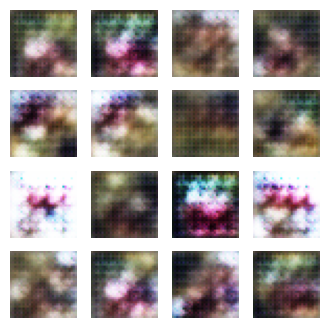

Time for epoch 21 is 12.452887296676636 sec


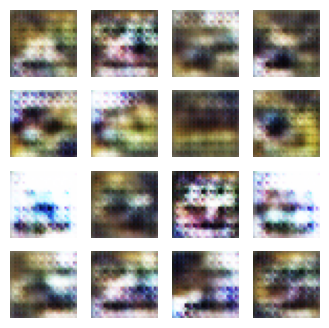

Time for epoch 22 is 12.395078182220459 sec


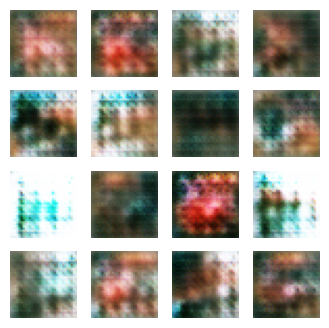

Time for epoch 23 is 12.768948078155518 sec


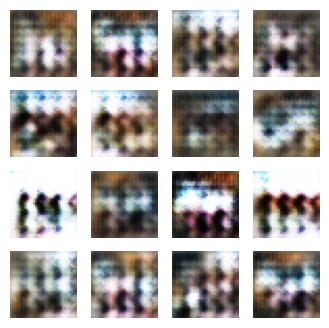

Time for epoch 24 is 12.493494033813477 sec


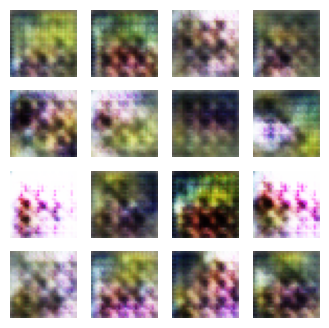

Time for epoch 25 is 12.503833055496216 sec


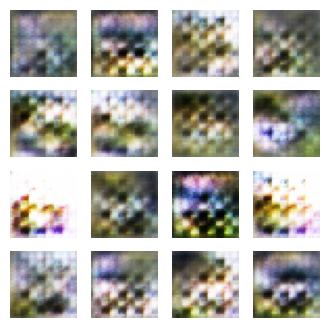

Time for epoch 26 is 12.472774028778076 sec


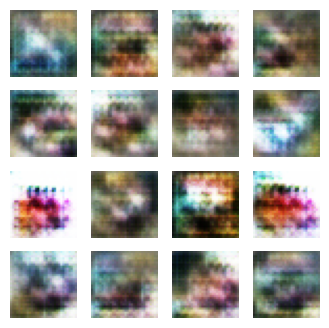

Time for epoch 27 is 12.773266077041626 sec


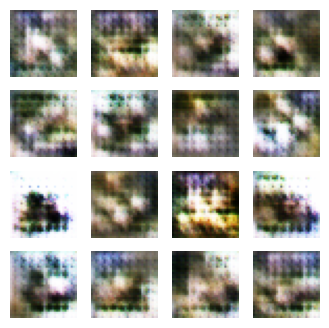

Time for epoch 28 is 12.400076389312744 sec


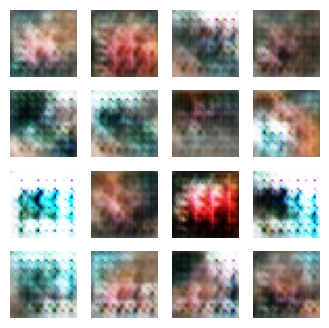

Time for epoch 29 is 12.41143536567688 sec


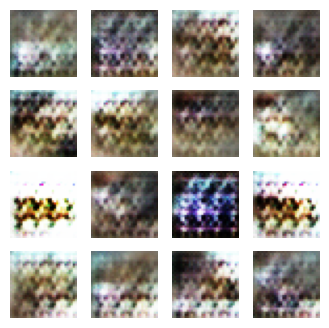

Time for epoch 30 is 12.571153163909912 sec


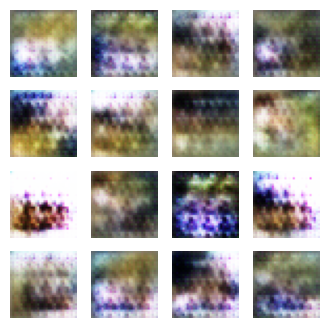

Time for epoch 31 is 12.758305549621582 sec


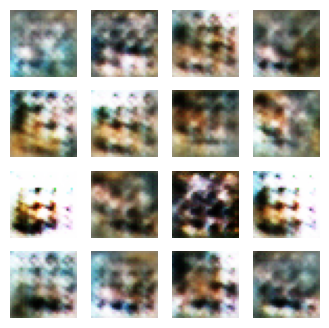

Time for epoch 32 is 12.468504190444946 sec


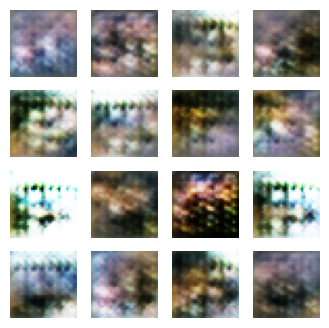

Time for epoch 33 is 12.514444828033447 sec


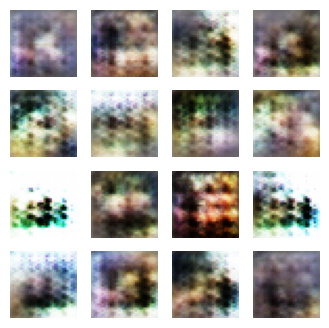

Time for epoch 34 is 12.431323766708374 sec


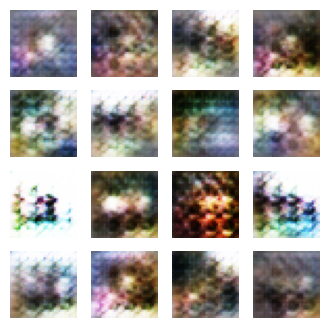

Time for epoch 35 is 12.747733116149902 sec


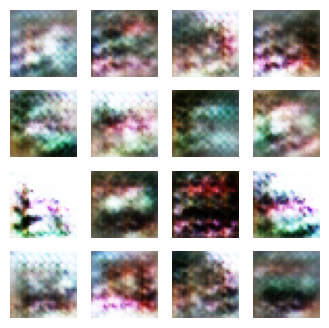

Time for epoch 36 is 12.385402202606201 sec


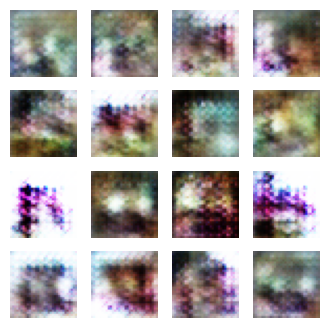

Time for epoch 37 is 12.429753065109253 sec


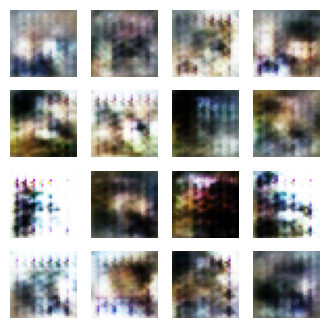

Time for epoch 38 is 12.483530759811401 sec


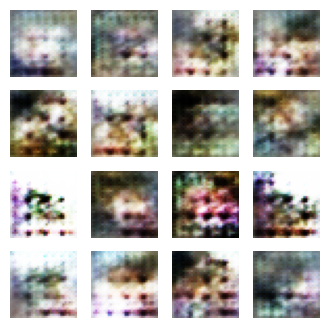

Time for epoch 39 is 12.83869457244873 sec


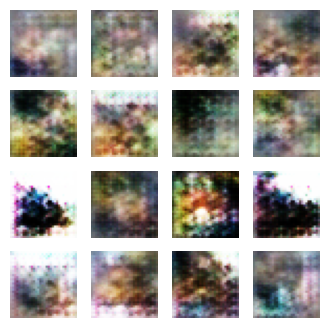

Time for epoch 40 is 12.48417329788208 sec


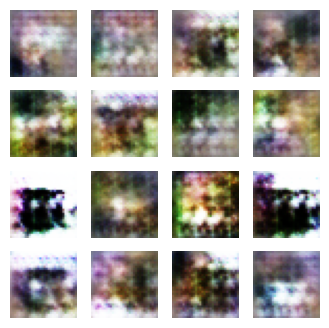

Time for epoch 41 is 12.437660455703735 sec


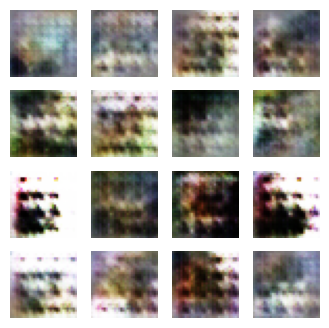

Time for epoch 42 is 12.433866739273071 sec


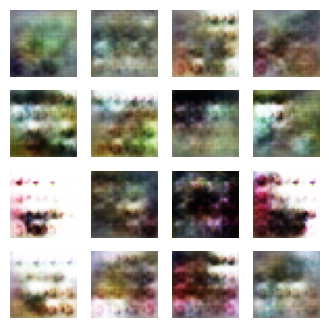

Time for epoch 43 is 12.773831367492676 sec


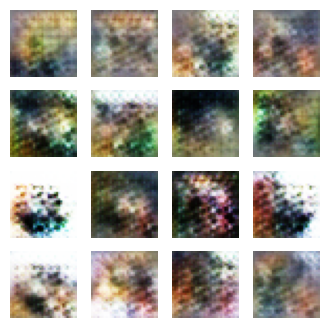

Time for epoch 44 is 12.391622543334961 sec


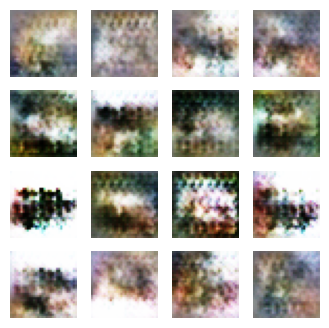

Time for epoch 45 is 12.639984846115112 sec


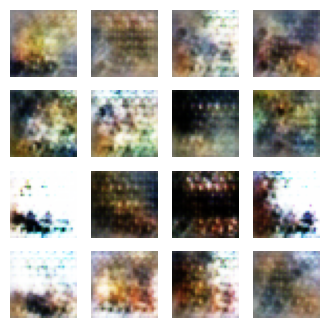

Time for epoch 46 is 12.421942472457886 sec


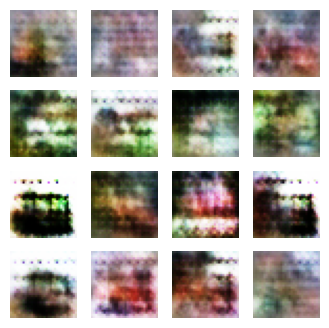

Time for epoch 47 is 12.468976497650146 sec


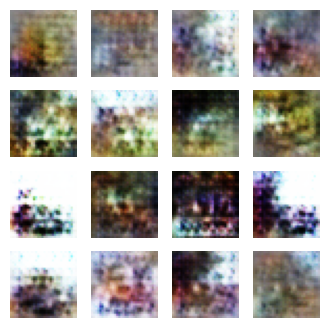

Time for epoch 48 is 12.787211656570435 sec


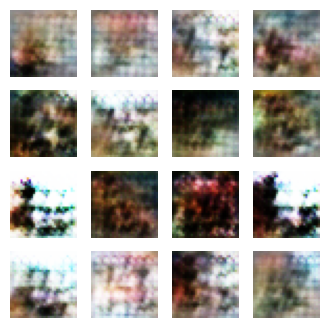

Time for epoch 49 is 12.405368328094482 sec


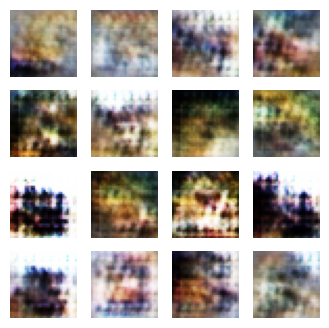

Time for epoch 50 is 12.403866052627563 sec


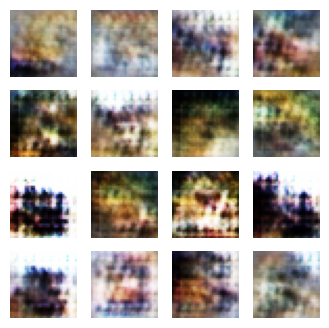

GIF saved at dcgan_training.gif


In [1]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
import time
from PIL import Image

# Load the CIFAR-10 dataset
(train_images, train_labels), (_, _) = tf.keras.datasets.cifar10.load_data()

# Preprocess the dataset
def preprocess_image(image):
    image = (image - 127.5) / 127.5  # Normalize to [-1, 1]
    return image

train_images = train_images.astype("float32")
train_images = preprocess_image(train_images)

BUFFER_SIZE = 50000  # Size of CIFAR-10 dataset
BATCH_SIZE = 256

# Create a TensorFlow dataset
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Generator Model
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((4, 4, 256)))
    assert model.output_shape == (None, 4, 4, 256)  # 4x4x256

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)

    return model

# Discriminator Model
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

# Loss Functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Optimizers
generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Checkpoints
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Training Loop
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# Seed for consistent image generation
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# List to store generated images for the GIF
generated_images_list = []

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        for image_batch in dataset:
            train_step(image_batch)

        # Produce images for the GIF as you go
        generate_and_save_images(generator, epoch + 1, seed)

        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print(f'Time for epoch {epoch + 1} is {time.time()-start} sec')

    # Generate after the final epoch
    generate_and_save_images(generator, epochs, seed)

    # Create the GIF
    create_gif()

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1) / 2)  # Scale images back to [0, 1]
        plt.axis('off')

    plt.savefig(f'image_at_epoch_{epoch:04d}.png')
    plt.show()

    # Save generated image for GIF
    generated_images_list.append(f'image_at_epoch_{epoch:04d}.png')

def create_gif():
    # Create a GIF from the saved images
    frames = [Image.open(image) for image in generated_images_list]
    gif_path = "dcgan_training.gif"
    frames[0].save(gif_path, save_all=True, append_images=frames[1:], duration=300, loop=0)
    print(f"GIF saved at {gif_path}")

# Train the DCGAN on the CIFAR-10 dataset
train(train_dataset, EPOCHS)


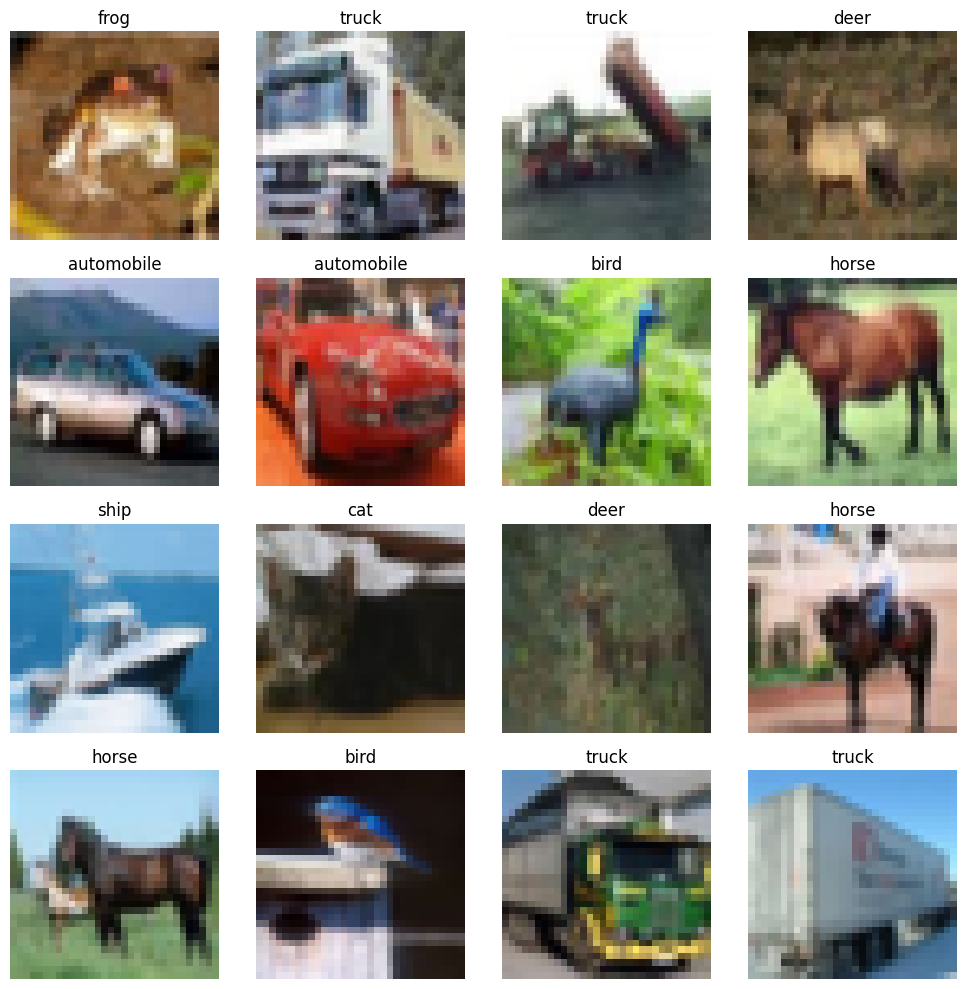

In [2]:
# Import required libraries
import matplotlib.pyplot as plt
import tensorflow as tf

# Load CIFAR-10 dataset
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

# Normalize images to range [0, 1]
train_images = train_images.astype("float32") / 255.0

# Class labels for CIFAR-10
class_labels = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

# Plot some sample images
plt.figure(figsize=(10, 10))
for i in range(16):  # Show 16 images
    plt.subplot(4, 4, i + 1)
    plt.imshow(train_images[i])
    plt.title(class_labels[train_labels[i][0]])
    plt.axis("off")
plt.tight_layout()
plt.show()
